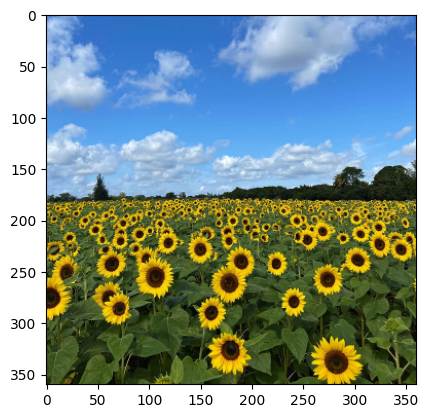

In [7]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

im = cv.imread('./the_berry_farms_sunflower_field.jpeg', cv.IMREAD_REDUCED_COLOR_4)
im = cv.cvtColor(im, cv.COLOR_BGR2RGB)
#plot image
plt.imshow(im)    

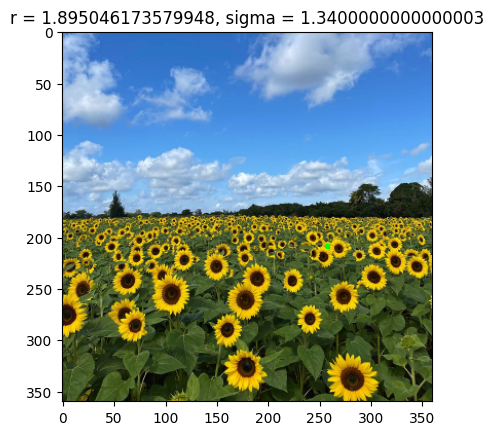

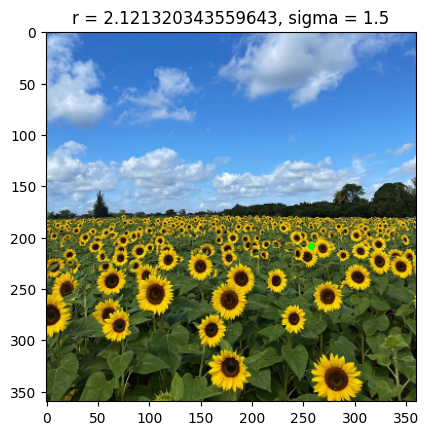

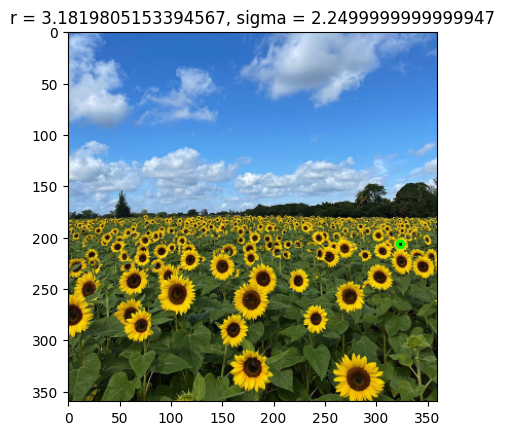

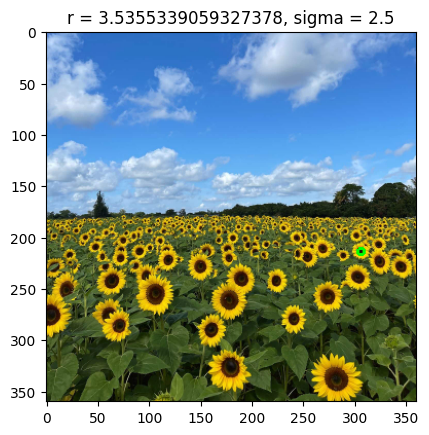

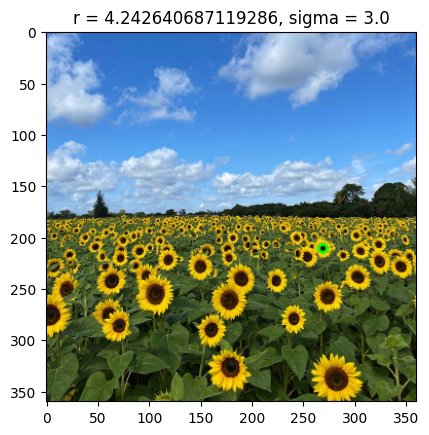

...

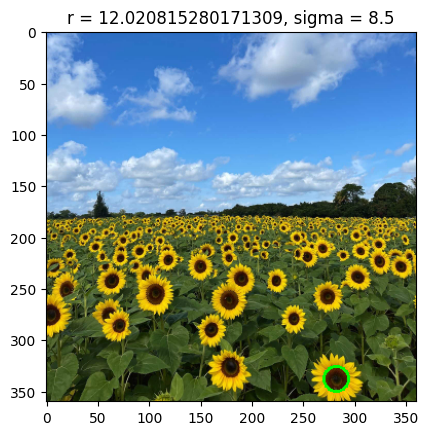

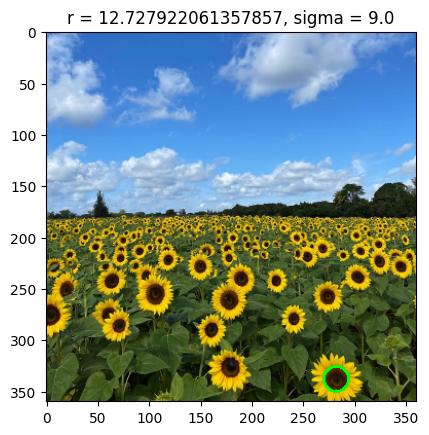

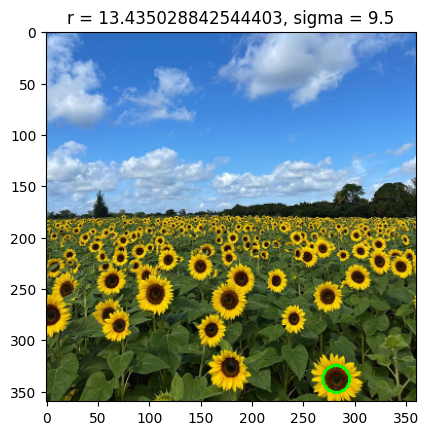

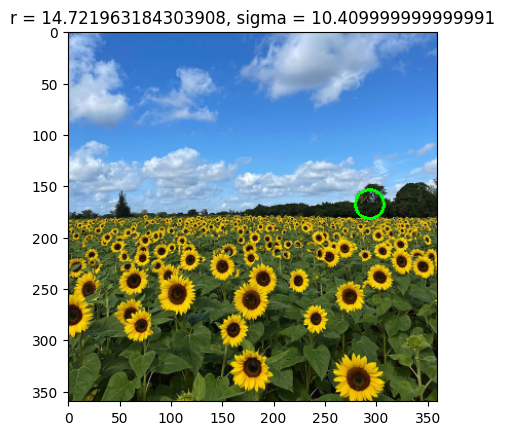

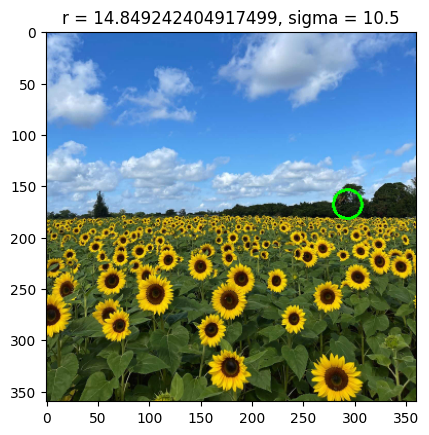

In [4]:
im_gray = cv.cvtColor(im, cv.COLOR_RGB2GRAY)
K = np.arange(1,11,0.5)
for k in K: 
    im_ = im.copy()   
    scale_space = np.empty((im.shape[0] ,im.shape[1] , 500), dtype=np.float64)
    sigmas = np.arange(k,k+0.5, 0.01)
    for i, sigma in enumerate(sigmas):
        log_hw = 3*np.ceil(np.max(sigmas))
        X, Y = np.meshgrid(np.arange(-log_hw, log_hw + 1, 1), np.arange(-log_hw, log_hw + 1, 1))
        log = 1/(2*np.pi*sigma**2)*(X**2/(sigma**2) + Y**2/(sigma**2) - 2)*np.exp(-(X**2 + Y**2)/(2*sigma**2))
        f_log = cv.filter2D(im_gray, cv.CV_64F, log)
        scale_space[:, :, i] = f_log

    indices = np.unravel_index(np.argmax(scale_space, axis=None), scale_space.shape)
    r = sigmas[indices[2]]*np.sqrt(2)
    
    #draw a circle around the detected blob
    cv.circle(im_, (int(indices[1]), int(indices[0])), int(r), (0,255,0), 2)
    fig, ax = plt.subplots()
    plt.title('r = ' + str(r) + ', sigma = ' + str(sigmas[indices[2]]))
    plt.imshow(im_)

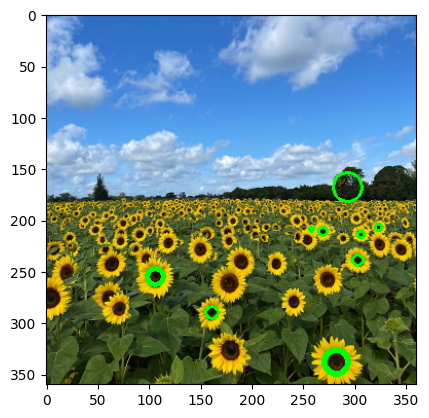

In [8]:
im_gray = cv.cvtColor(im, cv.COLOR_RGB2GRAY)
K = np.arange(1,11,0.5)
for k in K:    
    scale_space = np.empty((im.shape[0] ,im.shape[1] , 500), dtype=np.float64)
    sigmas = np.arange(k,k+0.5, 0.001)
    for i, sigma in enumerate(sigmas):
        log_hw = 3*np.ceil(np.max(sigmas))
        X, Y = np.meshgrid(np.arange(-log_hw, log_hw + 1, 1), np.arange(-log_hw, log_hw + 1, 1))
        log = 1/(2*np.pi*sigma**2)*(X**2/(sigma**2) + Y**2/(sigma**2) - 2)*np.exp(-(X**2 + Y**2)/(2*sigma**2))
        f_log = cv.filter2D(im_gray, cv.CV_64F, log)
        scale_space[:, :, i] = f_log

    indices = np.unravel_index(np.argmax(scale_space, axis=None), scale_space.shape)
    r = sigmas[indices[2]]*np.sqrt(2)
    
    #draw a circle around the detected blob
    cv.circle(im, (int(indices[1]), int(indices[0])), int(r), (0,255,0), 2)
fig, ax = plt.subplots()
plt.imshow(im)

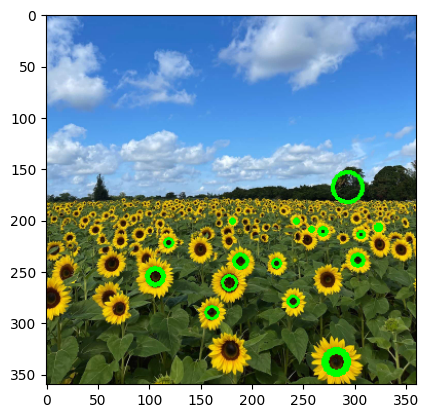

In [6]:
im_gray = cv.cvtColor(im, cv.COLOR_RGB2GRAY)
K = np.arange(1,11,0.125)
for k in K:    
    scale_space = np.empty((im.shape[0] ,im.shape[1] , 125), dtype=np.float64)
    sigmas = np.arange(k,k+0.125, 0.001)
    for i, sigma in enumerate(sigmas):
        log_hw = 3*np.ceil(np.max(sigmas))
        X, Y = np.meshgrid(np.arange(-log_hw, log_hw + 1, 1), np.arange(-log_hw, log_hw + 1, 1))
        log = 1/(2*np.pi*sigma**2)*(X**2/(sigma**2) + Y**2/(sigma**2) - 2)*np.exp(-(X**2 + Y**2)/(2*sigma**2))
        f_log = cv.filter2D(im_gray, cv.CV_64F, log)
        scale_space[:, :, i] = f_log

    indices = np.unravel_index(np.argmax(scale_space, axis=None), scale_space.shape)
    r = sigmas[indices[2]]*np.sqrt(2)
    
    #draw a circle around the detected blob
    cv.circle(im, (int(indices[1]), int(indices[0])), int(r), (0,255,0), 2)
fig, ax = plt.subplots()
plt.imshow(im)

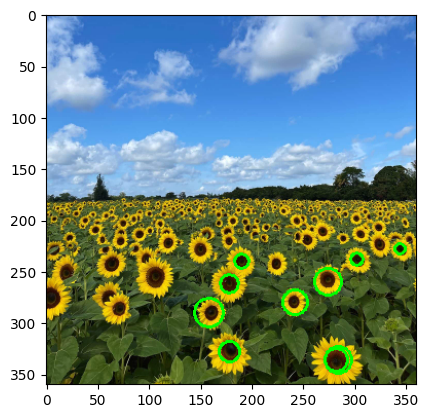

In [5]:
import cv
import numpy as np

# Load the image
image = cv.imread('./the_berry_farms_sunflower_field.jpeg', cv2.IMREAD_REDUCED_COLOR_4)

# Convert the image to grayscale (HoughCircles works on grayscale images)
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

# Apply Gaussian blur to reduce noise and improve circle detection
gray = cv.GaussianBlur(gray, (9, 9), 2, 2)

# Use the Hough Circle Transform to detect circles
circles = cv.HoughCircles(
    gray,                # Input grayscale image
    cv.HOUGH_GRADIENT,  # Detection method (Hough Gradient)
    dp=0.1,                # Inverse ratio of the accumulator resolution to the image resolution (1)
    minDist=2,          # Minimum distance between detected centers (in pixels)
    param1=10,           # Upper threshold for edge detection (canny edge detector)
    param2=25,           # Threshold for circle center detection
    minRadius=1,         # Minimum circle radius (0)
    maxRadius=15          # Maximum circle radius (0; this parameter is set automatically)
)

# If circles were found, draw them on the original image
if circles is not None:
    circles = np.uint16(np.around(circles))
    for circle in circles[0, :]:
        center = (circle[0], circle[1])
        radius = circle[2]
        
        # Draw the circle on the original image
        cv.circle(image, center, radius, (0, 255, 0), 2)

# Display the image with detected circles
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))

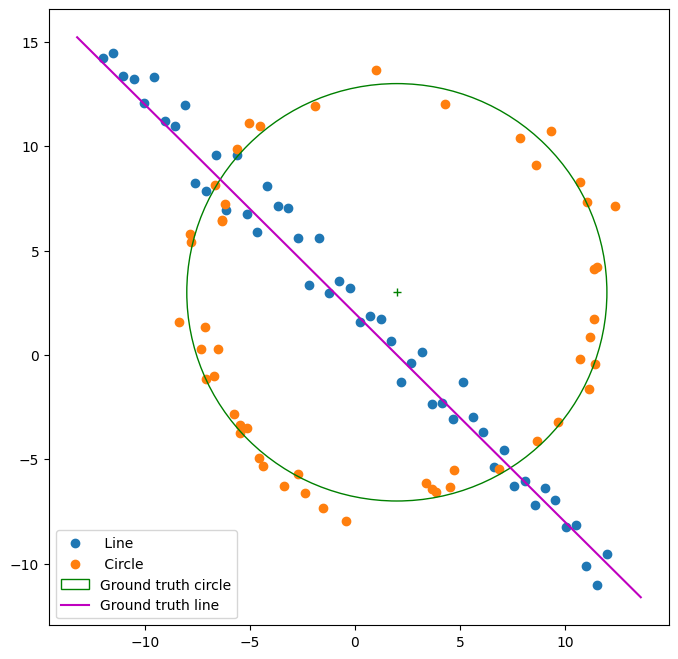

In [155]:
from scipy . optimize import minimize
from scipy import linalg
import matplotlib . pyplot as plt
import tikzplotlib
np.random.seed (0)
N = 100
half_n = N//2
r = 10
x0_gt , y0_gt = 2,3 # Center
s = r /16
t = np.random.uniform(0 , 2*np.pi, half_n )
n = s*np.random.randn( half_n )
x , y = x0_gt + (r + n)*np.cos(t) , y0_gt + (r + n)*np.sin (t)
X_circ = np . hstack ( ( x . reshape ( half_n , 1 ) , y . reshape ( half_n , 1 ) ) )
s = 1.
m, b = -1, 2
x = np.linspace (-12, 12 , half_n )
y = m*x + b + s*np.random.randn ( half_n )
X_line = np.hstack((x.reshape(half_n,1),y.reshape(half_n,1)))
all_points = np.vstack((X_circ,X_line )) # All points
fig , ax = plt . subplots (1 ,1 , figsize =(8 ,8))
ax . scatter ( X_line [ : , 0 ] , X_line [ : , 1 ] , label= ' Line ' )
ax . scatter ( X_circ [ : , 0 ] , X_circ [ : , 1 ] , label= ' Circle ' )
circle_gt = plt. Circle( ( x0_gt , y0_gt ) , r , color= 'g' , fill =False , label= 'Ground truth circle')
ax . add_patch (circle_gt )
ax . plot ( ( x0_gt ) , ( y0_gt ) , '+' , color= 'g' )
x_min , x_max = ax . get_xlim ( )
x_ = np . array ( [ x_min , x_max ] )
y_ = m*x_ + b
plt . plot (x_ , y_ , color= 'm' , label= 'Ground truth line')
plt . legend ( )


In [156]:
np.random.seed (0)
num_iterations = 1000
consensus_threshold = 1.6 # Maximum distance to say that a point is a inlier
min_samples = 2 # Minimum number of points to describe a model
# Define a function to calculate the distance from a point to a line
def distance_to_line(point, line_parameters):
    a, b, d = line_parameters
    x, y = point
    return np.abs(a * x + b * y -d) / np.sqrt(a**2 + b**2)
#Define a line goes through two points
def line(x,y):
    m = (y[1] - y[0])/(x[1] - x[0])
    c = y[0] - m*x[0]
    a = -m
    b = 1
    d = c
    return  a , b , d
points = all_points
for _ in range(num_iterations):
    # Randomly select two points 
    selected_indices_L = np.random.choice(len(points), size=min_samples, replace=False)
    selected_points_L = points[selected_indices_L]
    # Fit a line to the selected points and get the line parameters
    a, b, d = line(selected_points_L[:,0], selected_points_L[:,1])
    # (a**2 + b**2) = 1 =>
    norm = np.sqrt(a**2 + b**2)
    a /= norm
    b /= norm
    d /= norm
    consensus_set_L = []
    # Find the consensus set by checking each point against the line
    for i, point in enumerate(points):
        if distance_to_line(point, [a, b, d]) < consensus_threshold:
            consensus_set_L.append(i)
    if len(consensus_set_L) >45:
        break


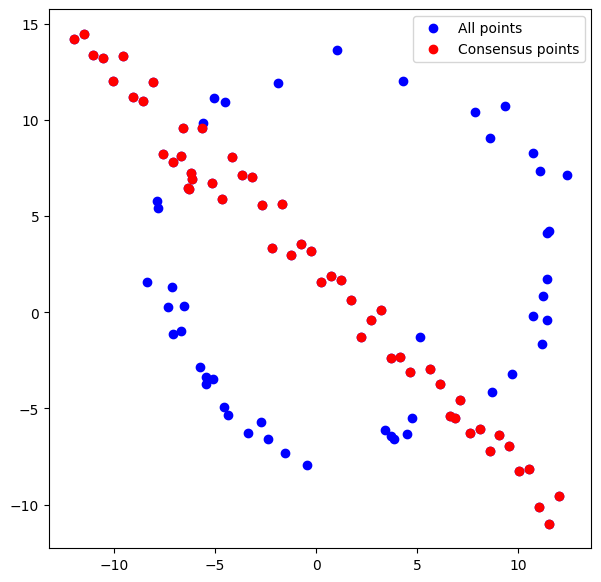

In [157]:

#plot the estimated line
xc_L = points[consensus_set_L,0]
yc_L = points[consensus_set_L,1]
x = points[:,0]
y = points[:,1]
plt.figure(figsize=(7,7))
plt.plot(x, y, 'o', color='b', label='All points')
plt.plot(xc_L, yc_L, 'o', color='r', label='Consensus points')
plt.legend(loc='best')



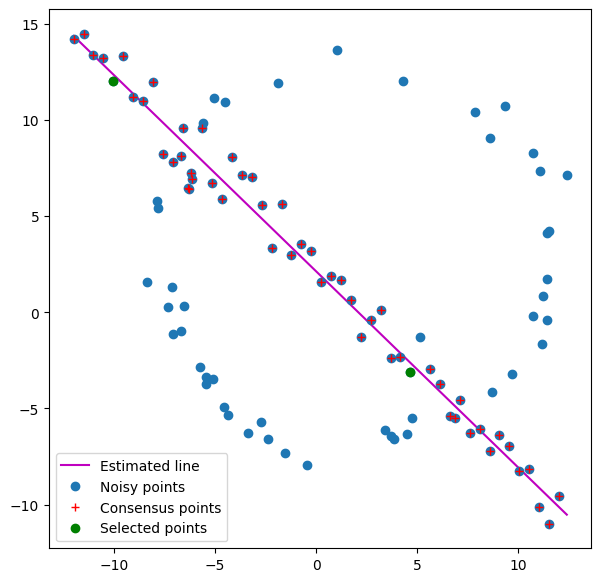

In [158]:
#estimate the line parameters using the consensus set 
A = np.hstack((xc_L.reshape(len(xc_L),1), np.ones((len(xc_L),1))))
b_ = yc_L.reshape(len(yc_L),1)
xstar = np.linalg.inv(A.T.dot(A)).dot(A.T).dot(b_)
mstar = xstar[0]
cstar = xstar[1]

#plot the estimated line
x_ = np.array([np.min(x), np.max(x)])
y_ = mstar*x_ + cstar
plt.figure(figsize=(7,7))
plt.plot(x_, y_, color='m', label='Estimated line')
plt.plot(x,y, 'o', label='Noisy points')
plt.plot(xc_L, yc_L, '+', color='r' , label='Consensus points')
plt.plot(selected_points_L[:,0], selected_points_L[:,1] , 'o', color='g', label='Selected points')
plt.legend(loc='best')


In [159]:
print(mstar, cstar)

[-1.02077733] [2.12396487]


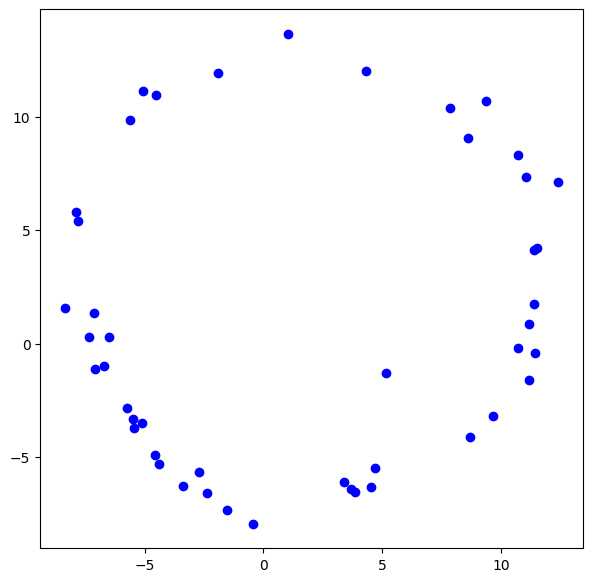

In [160]:
remaining_points = np.delete(points, consensus_set_L, axis=0)
#plot remaining points
x_r = remaining_points[:,0]
y_r = remaining_points[:,1]
plt.figure(figsize=(7,7))
plt.plot(x_r, y_r, 'o', color='b', label='Remaining points')


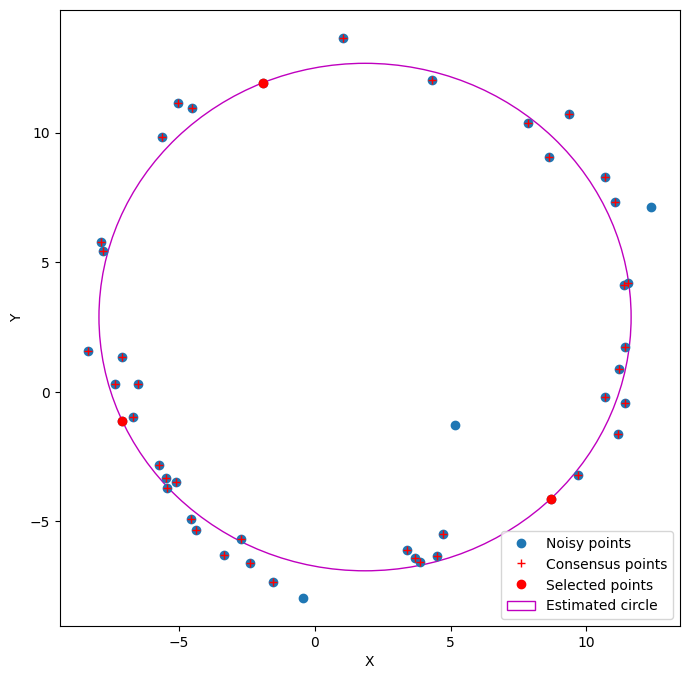

In [162]:
np.random.seed (0)
num_iterations = 1000
consensus_threshold = 1.1 # Maximum distance to say that a point is an inlier
min_samples = 3 # Minimum number of points to describe a model
# Define a function to calculate the distance from a point to a circle
def distance_to_circle(point, circle_parameters):
    x0, y0, r = circle_parameters
    x, y = point
    return np.abs(np.sqrt((x - x0)**2 + (y - y0)**2) - r)
# Define a function to fit a circle through three points
def circle(x, y):
    x1, x2, x3 = x
    y1, y2, y3 = y
    A = np.array([[2*(x2-x1), 2*(y2-y1)], [2*(x3-x2), 2*(y3-y2)]])
    b = np.array([x2**2 + y2**2 - x1**2 - y1**2, x3**2 + y3**2 - x2**2 - y2**2])
    x0, y0 = np.linalg.inv(A).dot(b)
    r = np.sqrt((x1-x0)**2 + (y1-y0)**2)
    return x0, y0, r
new_points = remaining_points
estimated_circle = None
for _ in range(num_iterations):
    # Randomly select three points from the dataset
    selected_indices_C = np.random.choice(len(new_points), size=min_samples, replace=False)
    seletecd_points_C = new_points[selected_indices_C]
    # Fit a circle to the selected points
    x0, y0, r = circle(seletecd_points_C[:, 0], seletecd_points_C[:, 1])
    consensus_set_C = []
    # Find the consensus set by checking each point against the circle
    for i, point in enumerate(new_points):
        if distance_to_circle(point, [x0, y0, r]) < consensus_threshold:
            consensus_set_C.append(i)
    if len(consensus_set_C) > 42:
        estimated_circle = [x0, y0, r]
        break

# Plot the noisy points and the estimated circle
x = new_points[:, 0]
y = new_points[:, 1]
xc_C = new_points[consensus_set_C, 0]
yc_C = new_points[consensus_set_C, 1]

plt.figure(figsize=(8, 8))
plt.plot(x, y, 'o', label='Noisy points')
plt.plot(xc_C, yc_C, '+', color='r', label='Consensus points')
plt.plot( seletecd_points_C[:, 0], seletecd_points_C[:, 1], 'o', color='r', label='Selected points')
circle_ = plt.Circle((estimated_circle[0], estimated_circle[1]), estimated_circle[2], color='m', fill=False, label='Estimated circle')
ax = plt.gca()
ax.add_patch(circle_)
plt.legend(loc='best')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()



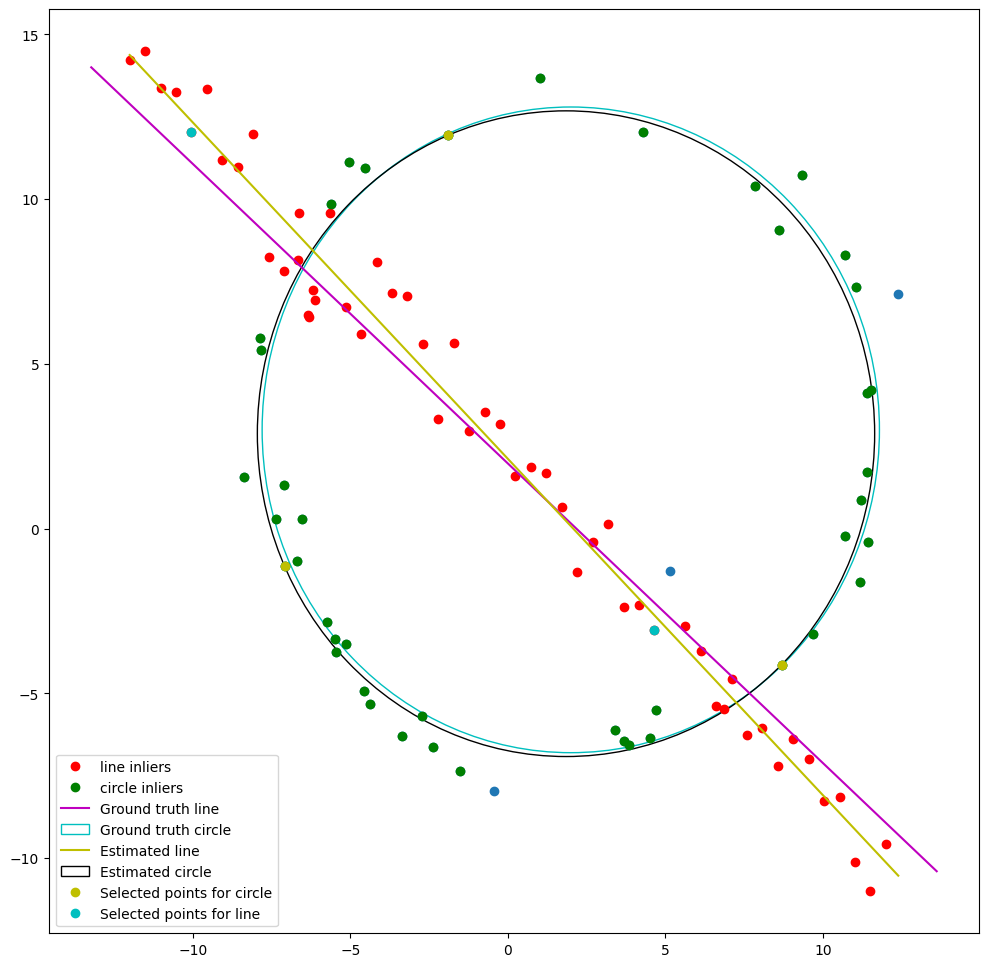

In [163]:
#set figure size
plt.figure(figsize=(12,12))

# plot line inliers
plt.plot(x , y , 'o' )
plt.plot(xc_L , yc_L , 'o' , color= 'r' , label= 'line inliers')

# plot circle inliers
plt.plot(xc_C , yc_C , 'o' , color= 'g' , label= 'circle inliers')

#plot the line ground truth
x_temp = np . array ( [ x_min , x_max ] )
y_temp = (-1)*x_ + 2
plt . plot (x_temp , y_temp , color= 'm' , label= 'Ground truth line')

#plot the circle ground truth
circle_ = plt.Circle((x0_gt , y0_gt ) , r , color= 'c' , fill =False , label= 'Ground truth circle')
ax = plt.gca()
ax.add_patch(circle_)

#plot the estimated line
plt.plot(x_ , y_ , color= 'y' , label= 'Estimated line')

#plot the estimated circle
circle_ = plt.Circle((estimated_circle[0], estimated_circle[1]),  estimated_circle[2], color='k', fill=False, label='Estimated circle')
ax = plt.gca()
ax.add_patch(circle_)

#plot the selected points
plt.plot( seletecd_points_C[:, 0], seletecd_points_C[:, 1], 'o', color='y', label='Selected points for circle')
plt.plot(selected_points_L[:,0], selected_points_L[:,1] , 'o', color='c', label='Selected points for line')
plt.legend(loc='best')

In [164]:
print('circle center: ', estimated_circle[0], estimated_circle[1], 'circle radius: ', estimated_circle[2])

circle center:  1.8482366664535408 2.8833855653791987 circle radius:  9.796026338006078


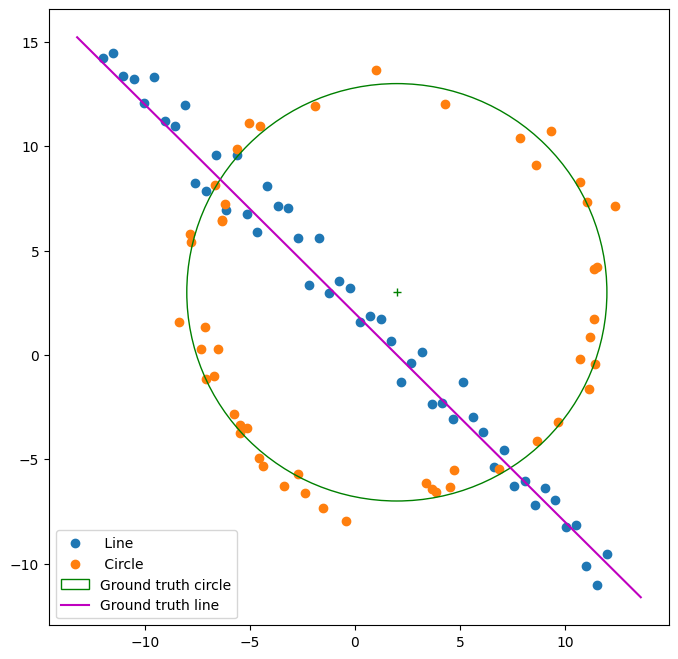

In [18]:
#estmate the circle first

np.random.seed (0)
N = 100
half_n = N//2
r = 10
x0_gt , y0_gt = 2,3 # Center
s = r /16
t = np.random.uniform(0 , 2*np.pi, half_n )
n = s*np.random.randn( half_n )
x , y = x0_gt + (r + n)*np.cos(t) , y0_gt + (r + n)*np.sin (t)
X_circ = np . hstack ( ( x . reshape ( half_n , 1 ) , y . reshape ( half_n , 1 ) ) )
s = 1.
m, b = -1, 2
x = np.linspace (-12, 12 , half_n )
y = m*x + b + s*np.random.randn ( half_n )
X_line = np.hstack((x.reshape(half_n,1),y.reshape(half_n,1)))
all_points = np.vstack((X_circ,X_line )) # All points
fig , ax = plt . subplots (1 ,1 , figsize =(8 ,8))
ax . scatter ( X_line [ : , 0 ] , X_line [ : , 1 ] , label= ' Line ' )
ax . scatter ( X_circ [ : , 0 ] , X_circ [ : , 1 ] , label= ' Circle ' )
circle_gt = plt. Circle( ( x0_gt , y0_gt ) , r , color= 'g' , fill =False , label= 'Ground truth circle')
ax . add_patch (circle_gt )
ax . plot ( ( x0_gt ) , ( y0_gt ) , '+' , color= 'g' )
x_min , x_max = ax . get_xlim ( )
x_ = np . array ( [ x_min , x_max ] )
y_ = m*x_ + b
plt . plot (x_ , y_ , color= 'm' , label= 'Ground truth line')
plt . legend ( )

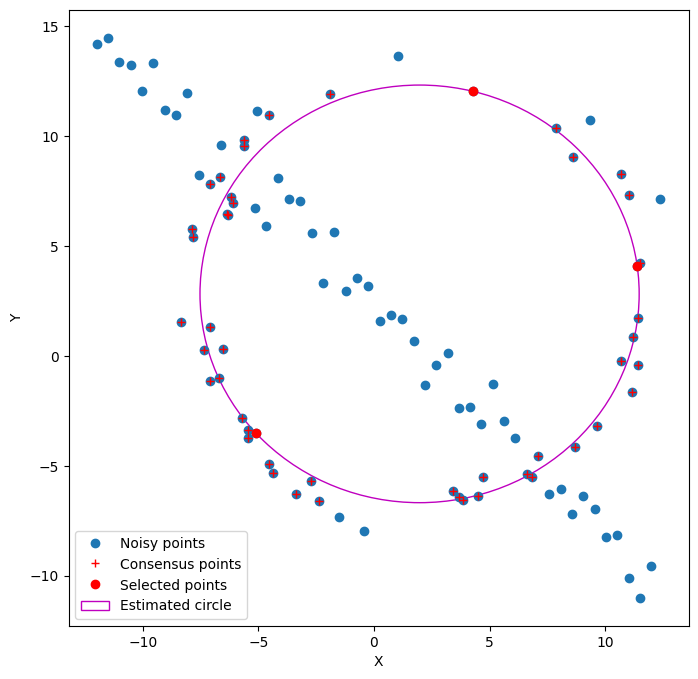

In [187]:
np.random.seed (10)
num_iterations = 1000
consensus_threshold = 1.1 # Maximum distance to say that a point is an inlier
min_samples = 3 # Minimum number of points to describe a model
# Define a function to calculate the distance from a point to a circle
def distance_to_circle(point, circle_parameters):
    x0, y0, r = circle_parameters
    x, y = point
    return np.abs(np.sqrt((x - x0)**2 + (y - y0)**2) - r)
# Define a function to fit a circle through three points
def circle(x, y):
    x1, x2, x3 = x
    y1, y2, y3 = y
    A = np.array([[2*(x2-x1), 2*(y2-y1)], [2*(x3-x2), 2*(y3-y2)]])
    b = np.array([x2**2 + y2**2 - x1**2 - y1**2, x3**2 + y3**2 - x2**2 - y2**2])
    x0, y0 = np.linalg.inv(A).dot(b)
    r = np.sqrt((x1-x0)**2 + (y1-y0)**2)
    return x0, y0, r
new_points = all_points
estimated_circle = None
for _ in range(num_iterations):
    # Randomly select three points from the dataset
    selected_indices_C = np.random.choice(len(new_points), size=min_samples, replace=False)
    seletecd_points_C = new_points[selected_indices_C]
    # Fit a circle to the selected points
    x0, y0, r = circle(seletecd_points_C[:, 0], seletecd_points_C[:, 1])
    consensus_set_C = []
    # Find the consensus set by checking each point against the circle
    for i, point in enumerate(new_points):
        if distance_to_circle(point, [x0, y0, r]) < consensus_threshold:
            consensus_set_C.append(i)
    if len(consensus_set_C) > 42:
        estimated_circle = [x0, y0, r]
        break

# Plot the noisy points and the estimated circle
x = new_points[:, 0]
y = new_points[:, 1]
xc_C = new_points[consensus_set_C, 0]
yc_C = new_points[consensus_set_C, 1]

plt.figure(figsize=(8, 8))
plt.plot(x, y, 'o', label='Noisy points')
plt.plot(xc_C, yc_C, '+', color='r', label='Consensus points')
plt.plot( seletecd_points_C[:, 0], seletecd_points_C[:, 1], 'o', color='r', label='Selected points')
circle_ = plt.Circle((estimated_circle[0], estimated_circle[1]), estimated_circle[2], color='m', fill=False, label='Estimated circle')
ax = plt.gca()
ax.add_patch(circle_)
plt.legend(loc='best')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

In [188]:
print('circle center: ', estimated_circle[0], estimated_circle[1], 'circle radius: ', estimated_circle[2])

circle center:  1.9735828585060529 2.8283325620075677 circle radius:  9.503678746476332


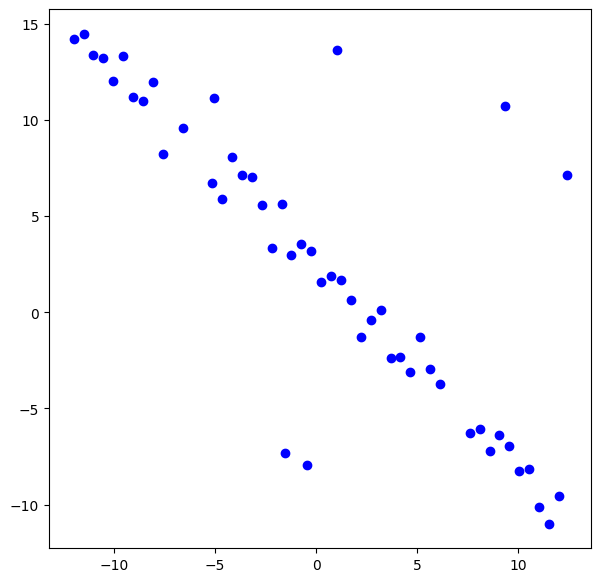

In [193]:
remaining_points = np.delete(all_points, consensus_set_C, axis=0)
#plot remaining points
x_r = remaining_points[:,0]
y_r = remaining_points[:,1]
plt.figure(figsize=(7,7))
plt.plot(x_r, y_r, 'o', color='b', label='Remaining points')

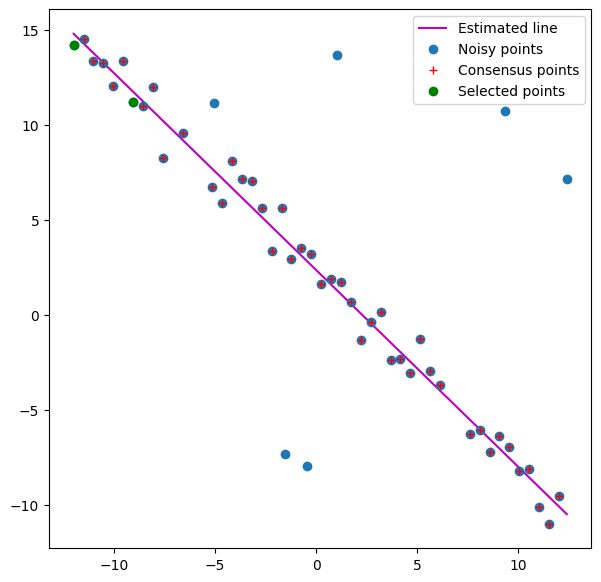

In [195]:
np.random.seed (10)
num_iterations = 1000
consensus_threshold = 1.6 # Maximum distance to say that a point is a inlier
min_samples = 2 # Minimum number of points to describe a model
# Define a function to calculate the distance from a point to a line
def distance_to_line(point, line_parameters):
    a, b, d = line_parameters
    x, y = point
    return np.abs(a * x + b * y -d) / np.sqrt(a**2 + b**2)
#Define a line goes through two points
def line(x,y):
    m = (y[1] - y[0])/(x[1] - x[0])
    c = y[0] - m*x[0]
    a = -m
    b = 1
    d = c
    return  a , b , d
points = remaining_points
for _ in range(num_iterations):
    # Randomly select two points 
    selected_indices_L = np.random.choice(len(points), size=min_samples, replace=False)
    selected_points_L = points[selected_indices_L]
    # Fit a line to the selected points and get the line parameters
    a, b, d = line(selected_points_L[:,0], selected_points_L[:,1])
    # (a**2 + b**2) = 1 =>
    norm = np.sqrt(a**2 + b**2)
    a /= norm
    b /= norm
    d /= norm
    consensus_set_L = []
    # Find the consensus set by checking each point against the line
    for i, point in enumerate(points):
        if distance_to_line(point, [a, b, d]) < consensus_threshold:
            consensus_set_L.append(i)
    if len(consensus_set_L) >45:
        break
    
    
    
#plot the estimated line
xc_L = points[consensus_set_L,0]
yc_L = points[consensus_set_L,1]
x = points[:,0]
y = points[:,1]

#estimate the line parameters using the consensus set 
A = np.hstack((xc_L.reshape(len(xc_L),1), np.ones((len(xc_L),1))))
b_ = yc_L.reshape(len(yc_L),1)
xstar = np.linalg.inv(A.T.dot(A)).dot(A.T).dot(b_)
mstar = xstar[0]
cstar = xstar[1]

#plot the estimated line
x_ = np.array([np.min(x), np.max(x)])
y_ = mstar*x_ + cstar
plt.figure(figsize=(7,7))
plt.plot(x_, y_, color='m', label='Estimated line')
plt.plot(x,y, 'o', label='Noisy points')
plt.plot(xc_L, yc_L, '+', color='r' , label='Consensus points')
plt.plot(selected_points_L[:,0], selected_points_L[:,1] , 'o', color='g', label='Selected points')
plt.legend(loc='best')

In [196]:
print(mstar, cstar)

[-1.03647384] [2.35026823]


In [175]:
def measure_images(image_1, image_2):  
    # Find points on the architectural image that correspond to the flag image
    coordinates = [] # Create an empty list to store the coordinates

    # Function to handle mouse events (clicks)
    def click_event(event, x, y, flags, param):
        nonlocal coordinates
        if event == cv.EVENT_LBUTTONDOWN:
            coordinates.append((x, y))
            cv.circle(image_1, (x, y), 5, (0, 0, 255), -1) # Draw a red circle at the clicked point (x, y)
            cv.imshow('Image', image_1) 
            if len(coordinates) == 4:
                cv.destroyAllWindows()

    cv.imshow('Image', image_1)
    cv.setMouseCallback('Image', click_event) # Set the mouse callback function for the 'Image' window

    while len(coordinates) < 4:
        cv.waitKey(1)
        
    image_1_points = np.array(coordinates, dtype=np.float32)

    image_2_width = image_2.shape[1] # Width of the flag image 
    image_2_height = image_2.shape[0] # Height of the flag image
    image_2_points = np.array([[0, 0], [image_2_width, 0], [image_2_width, image_2_height], [0, image_2_height]], dtype=np.float32)
    
    return image_1_points, image_2_points


def superimpose_images(image_1, image_2, image_1_points, image_2_points, alpha , beta):
    # Compute the homography matrix
    homography_matrix= cv.findHomography(image_2_points, image_1_points)[0]

    # Warp the flag image to fit the architectural image
    image_2_warped = cv.warpPerspective(image_2, homography_matrix, (image_1.shape[1], image_1.shape[0]))

    #Blend the images
    blended_image = cv.addWeighted(image_1, alpha, image_2_warped, beta, 0)
    
    return blended_image



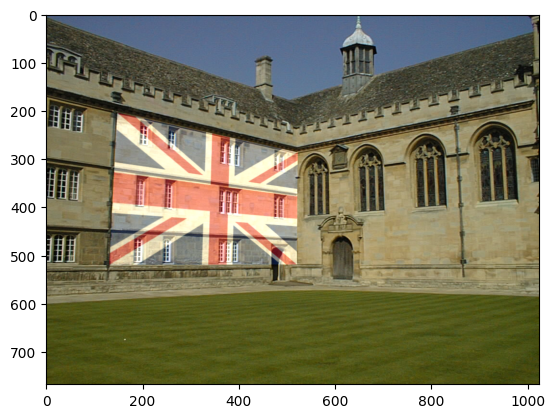

In [22]:
image_1 = cv.imread('./Buliding.jpg', cv.IMREAD_COLOR)
image_2 = cv.imread('./Flag_of_the_United_Kingdom_(1-2).svg.png')
image_1_points, image_2_points = measure_images(image_1, image_2)
image_1 = cv.imread('./Buliding.jpg', cv.IMREAD_COLOR)
blended_image = superimpose_images(image_1, image_2, image_1_points, image_2_points , 0.9 , 0.45)
 
# Display original images and super imposed image
plt.imshow(cv.cvtColor(blended_image, cv.COLOR_BGR2RGB))



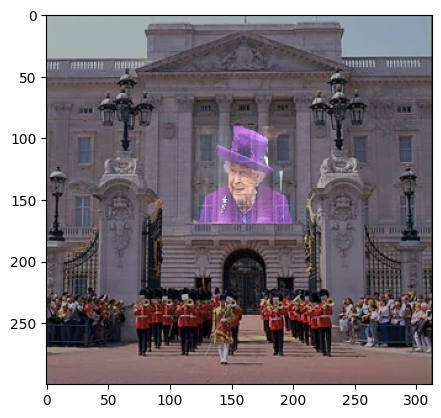

In [23]:
image_1 = cv.imread('./gate-Buckingham-Palace-London.webp' )
image_2 = cv.imread('./elizabeth.webp')
image_1_points, image_2_points = measure_images(image_1, image_2)
image_1 = cv.imread('./gate-Buckingham-Palace-London.webp')
blended_image = superimpose_images(image_1, image_2, image_1_points, image_2_points , 0.7 , 0.6)
 
# Display original images and super imposed image
plt.imshow(cv.cvtColor(blended_image, cv.COLOR_BGR2RGB))

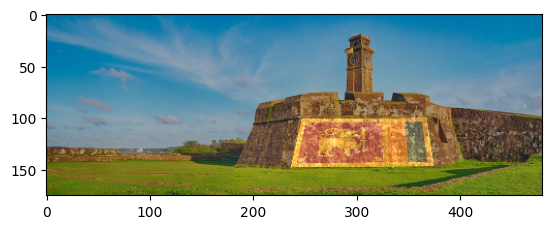

In [24]:
image_1 = cv.imread('./2d9a6184ea9e5f4b9a3a1f624de76a5d.jpg' , cv.IMREAD_REDUCED_COLOR_4)
image_2 = cv.imread('./slFlag.jpeg')
image_1_points, image_2_points = measure_images(image_1, image_2)
image_1 = cv.imread('./2d9a6184ea9e5f4b9a3a1f624de76a5d.jpg' , cv.IMREAD_REDUCED_COLOR_4)
blended_image = superimpose_images(image_1, image_2, image_1_points, image_2_points , 0.7 , 0.38)
 
# Display original images and super imposed image
plt.imshow(cv.cvtColor(blended_image, cv.COLOR_BGR2RGB))

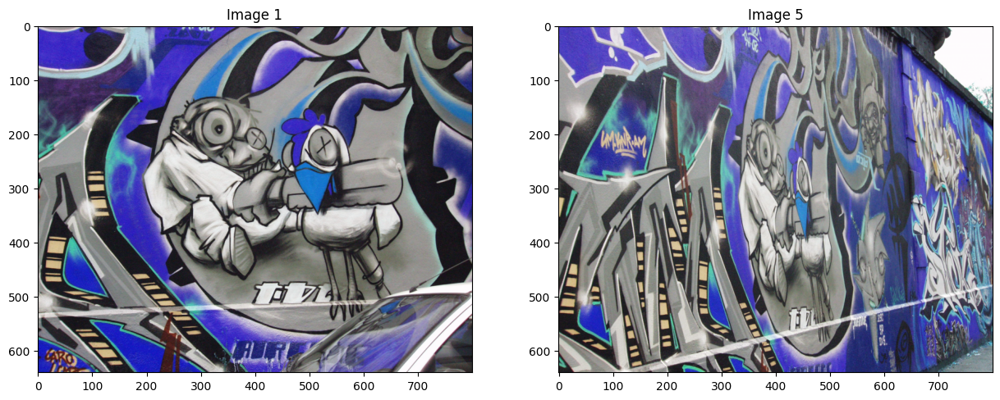

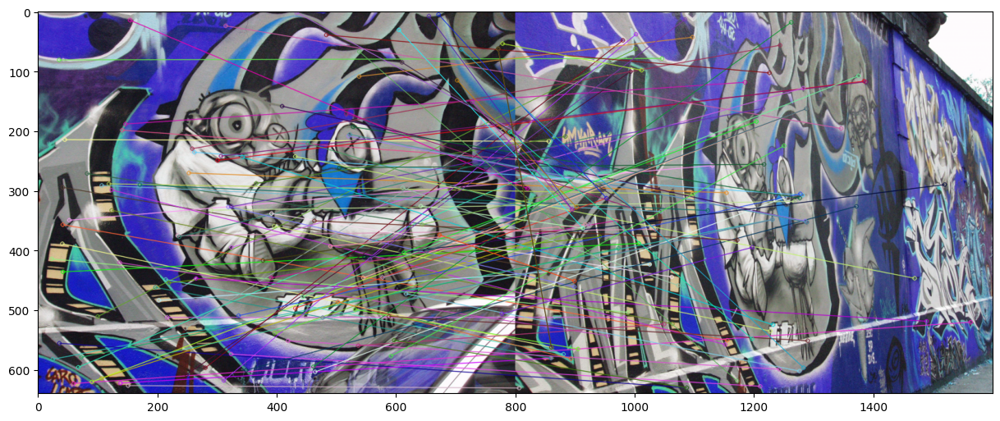

In [12]:

img1 = cv.imread('./img1.ppm')
img5 = cv.imread('./img5.ppm')


# Detect keypoints and compute descriptors
keypoints1, descriptors1 = cv.SIFT_create().detectAndCompute(img1, None)
keypoints5, descriptors5 = cv.SIFT_create().detectAndCompute(img5, None)

# Match descriptors between the two images
matches = cv.FlannBasedMatcher().knnMatch(descriptors1, descriptors5, k=2)

# select good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

# Draw the matches
matched_image = cv.drawMatches(img1, keypoints1, img5, keypoints5, good_matches, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matches and original images
fig1, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))
ax1.imshow(img1, cmap='gray')
ax1.set_title('Image 1')
ax2.imshow(img5, cmap='gray')
ax2.set_title('Image 5')
plt.show()

fig2, ax = plt.subplots(figsize=(15, 15))
ax.imshow(matched_image)


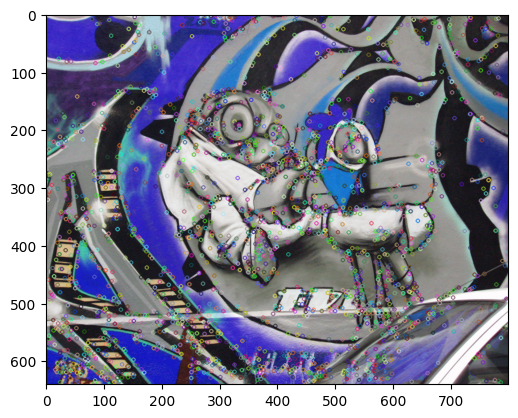

In [13]:
image1_with_keypoints = cv.drawKeypoints(img1, keypoints1, None)
plt.imshow(image1_with_keypoints)

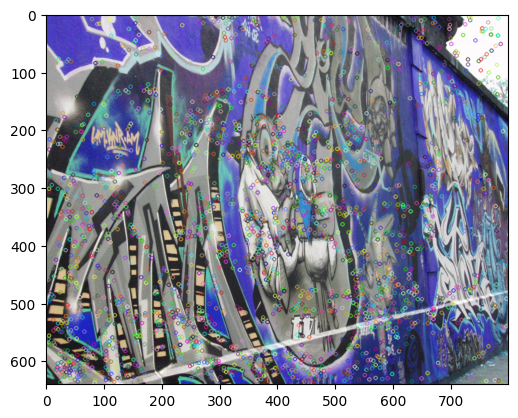

In [14]:
image5_with_keypoints = cv.drawKeypoints(img5, keypoints1, None)
plt.imshow(image5_with_keypoints)


In [16]:


def compute_homography_ransac(src_pts, dst_pts, num_iterations=1000, consensus_threshold=5.0):
    best_homography = None
    best_inliers = 0

    for _ in range(num_iterations):
        # Randomly sample 4 correspondences
        indices = np.random.choice(len(src_pts), 4, replace=False)
        src_sample = src_pts[indices]
        dst_sample = dst_pts[indices]

        # Compute the homography matrix for this sample
        homography, _ = cv.findHomography(src_sample, dst_sample)

        # Transform all source points using the current homography
        transformed_pts = cv.perspectiveTransform(src_pts.reshape(-1, 1, 2), homography)

        # Calculate distances between the transformed points and destination points
        errors = np.sqrt(np.sum((transformed_pts.squeeze() - dst_pts) ** 2, axis=1))

        # Count inliers (points within tolerance)
        inliers = np.sum(errors < consensus_threshold)

        # Update the best homography if this sample has more inliers
        if inliers > best_inliers:
            best_homography = homography
            best_inliers = inliers

    return best_homography

src_pts = np.float64([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
dst_pts = np.float64([keypoints5[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

ransac_homography = compute_homography_ransac(src_pts, dst_pts, num_iterations=1000, consensus_threshold=60)
print("Estimated Homography Matrix:")
print(ransac_homography)


Estimated Homography Matrix:
[[-6.40819603e-01 -2.64393305e-01  3.51204169e+02]
 [-5.86754959e-01 -3.56335692e-01  3.52729114e+02]
 [-1.66368891e-03 -1.01122930e-03  1.00000000e+00]]


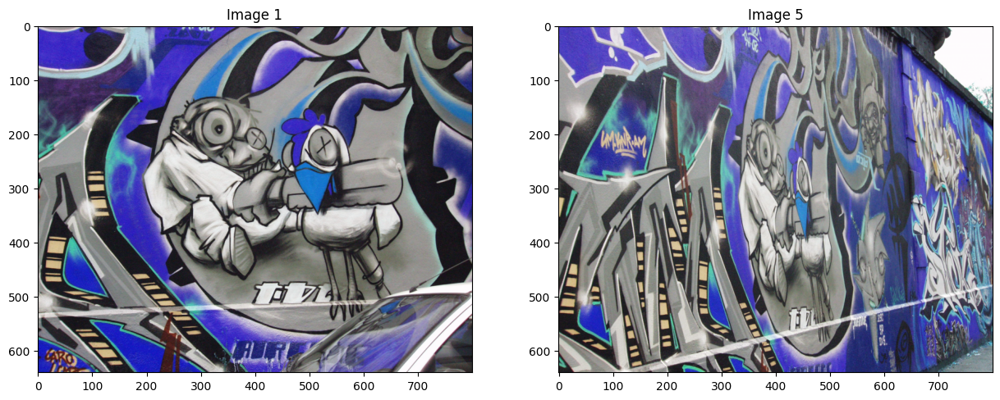

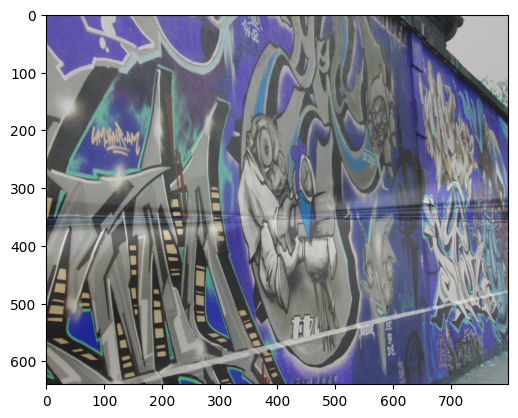

In [17]:
# Load the color versions of the images
img1_color = cv.imread('img1.ppm')
img5_color = cv.imread('img5.ppm')

# Apply the homography to img1 to align it with img5
stitched_image = cv.warpPerspective(img1_color, ransac_homography, (img5_color.shape[1], img5_color.shape[0]))

# Blend the two images 
alpha = 0.3  #  blending factor
blended_image = cv.addWeighted(img5_color, 1 - alpha, stitched_image, alpha, 0)

# Display the stitched and blended image and the original images
fig1 , (ax1, ax2 ) = plt.subplots(1,2, figsize=(15,15))
ax1.imshow(img1_color)
ax1.set_title('Image 1')
ax2.imshow(img5_color)
ax2.set_title('Image 5')
plt.show()

fig2 , ax = plt.subplots()
ax.imshow(blended_image)

In [311]:
 best_homography = np.array([[6.2544644e-01 , 5.7759174e-02 ,  2.2201217e+02],
   [2.2240536e-01 ,  1.1652147e+00 , -2.5605611e+01],
   [4.9212545e-04 , -3.6542424e-05 ,  1.0000000e+00]])

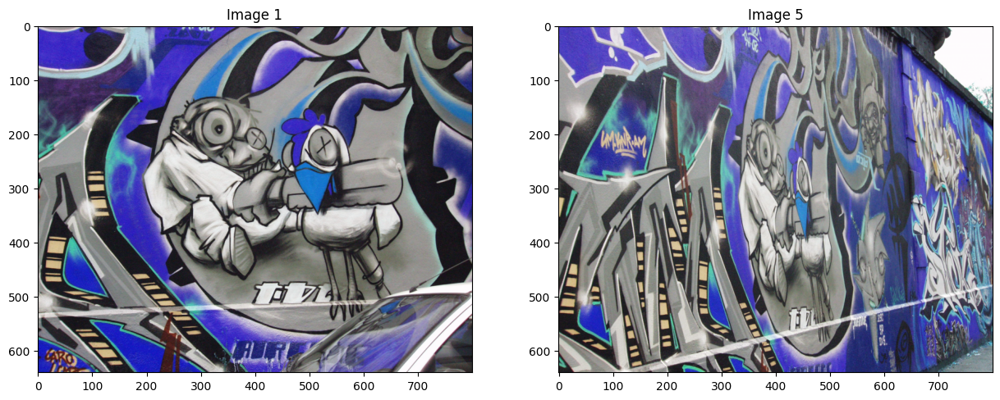

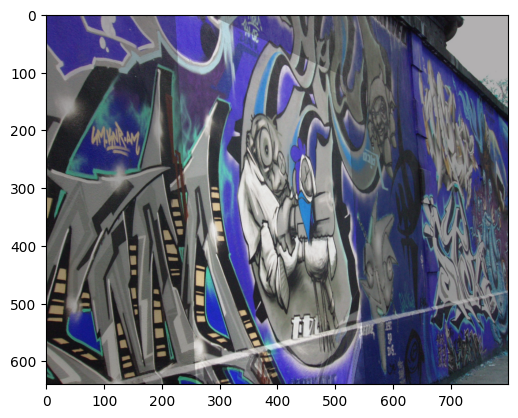

In [312]:
# Load the color versions of the images
img1_color = cv.imread('img1.ppm')
img5_color = cv.imread('img5.ppm')

# Apply the homography to img1 to align it with img5
stitched_image = cv.warpPerspective(img1_color, best_homography, (img5_color.shape[1], img5_color.shape[0]))

# Blend the two images 
alpha = 0.3  # blending factor
blended_image = cv.addWeighted(img5_color, 1 - alpha, stitched_image, alpha, 0)

# Display the stitched and blended image and the original images
fig1 , (ax1, ax2 ) = plt.subplots(1,2, figsize=(15,15))
ax1.imshow(img1_color)
ax1.set_title('Image 1')
ax2.imshow(img5_color)
ax2.set_title('Image 5')
plt.show()

fig2 , ax = plt.subplots()
ax.imshow(blended_image)

